In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler, StandardScaler,LabelEncoder
from sklearn.decomposition import PCA
import sqlite3
import copy
import plotly.express as px


In [2]:
# Connect to the sqlite db file and retrieve data as Pandas data frame.
# cnx = sqlite3.connect('FPA_FOD_20170508.sqlite')
# sql = "select * from fires"
# df = pd.read_sql_query(sql, cnx)

In [3]:
df = pd.read_csv('FW_Veg_Rem_Combined.csv')
df['disc_clean_date'] = pd.to_datetime(df['disc_clean_date'])
# df.sort_values(by='disc_clean_date', inplace = True) 

In [4]:
df.head()

,Unnamed: 0.1,Unnamed: 0,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,disc_clean_date,...,Wind_cont,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness
0,0,0,NaN,10.0,C,Missing/Undefined,18.105072,-66.753044,PR,2007-02-11,...,3.250413,78.216590,76.793750,76.381579,78.724370,0.0,0.0,0.0,0.0,0.017923
1,1,1,NaN,3.0,B,Arson,35.038330,-87.610000,TN,2006-12-11,...,2.122320,70.840000,65.858911,55.505882,81.682678,59.8,8.4,0.0,86.8,0.184355
2,2,2,NaN,60.0,C,Arson,34.947800,-88.722500,MS,2004-02-29,...,3.369050,75.531629,75.868613,76.812834,65.063800,168.8,42.2,18.1,124.5,0.194544
3,3,3,WNA 1,1.0,B,Debris Burning,39.641400,-119.308300,NV,2005-06-06,...,0.000000,44.778429,37.140811,35.353846,0.000000,10.4,7.2,0.0,0.0,0.487447
4,4,4,NaN,2.0,B,Miscellaneous,30.700600,-90.591400,LA,1999-09-22,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.214633


In [5]:
# Define a mapping to convert month names to numeric representation
month_to_number = {
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
    'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
}

df1 = copy.copy(df[['discovery_month', 'state']])

df2 = df1.groupby('discovery_month').count().reset_index()

custom_month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Sort the DataFrame by the 'Month' column using the custom order
df2['discovery_month'] = pd.Categorical(df2['discovery_month'], categories=custom_month_order, ordered=True)
df2.sort_values(by='discovery_month', inplace=True)
df2

# # # df2['state'] = df2['state'].astype(int)
fig = px.line_polar(df2, r=df2['state'], theta=df2['discovery_month'],line_close=True,template="plotly_dark",)
fig.show()


# df1['discovery_month'] = pd.to_datetime(df['discovery_month'])
# df1
# entries_per_month = df1.groupby(pd.Grouper(key='discovery_month', freq='M')).size()
           

# print(df1['putout_time'])



C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py:271: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  trace_data = trace_data.append(trace_data.iloc[0])


In [6]:
min_fire_size = df['fire_size'].min()
max_fire_size = df['fire_size'].max()

print(max_fire_size)

df['fire_size_norm'] = (df['fire_size'] - min_fire_size) / (max_fire_size - min_fire_size)
df

606945.0


,Unnamed: 0.1,Unnamed: 0,fire_name,fire_size,fire_size_class,stat_cause_descr,latitude,longitude,state,disc_clean_date,...,Hum_pre_30,Hum_pre_15,Hum_pre_7,Hum_cont,Prec_pre_30,Prec_pre_15,Prec_pre_7,Prec_cont,remoteness,fire_size_norm
0,0,0,NaN,10.0,C,Missing/Undefined,18.105072,-66.753044,PR,2007-02-11,...,78.216590,76.793750,76.381579,78.724370,0.0,0.0,0.0,0.0,0.017923,1.563570e-05
1,1,1,NaN,3.0,B,Arson,35.038330,-87.610000,TN,2006-12-11,...,70.840000,65.858911,55.505882,81.682678,59.8,8.4,0.0,86.8,0.184355,4.102517e-06
2,2,2,NaN,60.0,C,Arson,34.947800,-88.722500,MS,2004-02-29,...,75.531629,75.868613,76.812834,65.063800,168.8,42.2,18.1,124.5,0.194544,9.801555e-05
3,3,3,WNA 1,1.0,B,Debris Burning,39.641400,-119.308300,NV,2005-06-06,...,44.778429,37.140811,35.353846,0.000000,10.4,7.2,0.0,0.0,0.487447,8.073226e-07
4,4,4,NaN,2.0,B,Miscellaneous,30.700600,-90.591400,LA,1999-09-22,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.214633,2.454920e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55362,55362,55362,IMPACT,6289.0,G,Missing/Undefined,39.180000,-96.784167,KS,2015-10-15,...,65.671410,61.839572,54.625698,55.042092,35.4,8.2,0.0,249.0,0.331501,1.036090e-02
55363,55363,55363,BUTTE,70868.0,G,Missing/Undefined,38.342719,-120.695967,CA,2015-09-09,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.124683,1.167611e-01
55364,55364,55364,WILLOW,5702.0,G,Arson,37.262607,-119.511139,CA,2015-07-25,...,43.755556,43.755556,44.443975,35.924406,0.0,0.0,0.0,0.0,0.097682,9.393759e-03
55365,55365,55365,BARKER,3261.0,F,Miscellaneous,40.604300,-123.080450,CA,2015-07-31,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,0.178206,5.371974e-03


In [7]:
import folium
from folium.plugins import HeatMap, HeatMapWithTime

map_obj = folium.Map(location = [38.27312, -98.5821872], zoom_start = 4)


df['latitude'] = df['latitude'].astype(float)
df['longitude'] = df['longitude'].astype(float)

df_onlylarge = df[df['fire_mag'] >= 10.0]
df_heat = df_onlylarge[['longitude','latitude', 'fire_size_norm', 'disc_clean_date']]

# List comprehension to make out list of lists
heat_data = [[row['latitude'],row['longitude'],row['fire_size_norm']] for index, row in df_heat.iterrows()]
heat_time_dates =  [[row['disc_clean_date']] for index, row in df_heat.iterrows()]

HeatMap(heat_data, radius=10, blur=10).add_to(map_obj)

map_obj


In [8]:
import math
for i in range(0, len(df_onlylarge)):
    radius = math.sqrt((df_onlylarge.iloc[i]['fire_size']*4046.856422)/math.pi)
    folium.Circle(
    location = [df_onlylarge.iloc[i]['latitude'], df_onlylarge.iloc[i]['longitude']],
    radius = radius,
    tooltip = '<li><bold> Fire size: ' + str(df_onlylarge.iloc[i]['fire_size']) + ' acres' + 
              '<li><bold> Fire size class: ' + str(df_onlylarge.iloc[i]['fire_size_class']) +
              '<li><bold> Date: ' + str(df_onlylarge.iloc[i]['disc_clean_date'])
              
    ).add_to(map_obj)

In [9]:
map_obj

In [10]:
import plotly.graph_objects as go
df4 = copy.copy(df[['state', 'fire_size']])

df4 = df4.groupby('state').count().reset_index()
df4
fig = go.Figure(data=go.Choropleth(
    locations=df4['state'], # Spatial coordinates
    z = df4['fire_size'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Amount of forest fires",
))

fig.update_layout(
    title_text = 'Forest fires per state',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [17]:
# Define a mapping to convert month names to numeric representation
month_to_number = {
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6,
    'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
}

df1 = copy.copy(df[['discovery_month', 'fire_size']])

df2 = df1.groupby('discovery_month').mean().reset_index()

custom_month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Sort the DataFrame by the 'Month' column using the custom order
df2['discovery_month'] = pd.Categorical(df2['discovery_month'], categories=custom_month_order, ordered=True)
df2.sort_values(by='discovery_month', inplace=True)
df2

# # # df2['state'] = df2['state'].astype(int)
fig = px.line_polar(df2, r=df2['fire_size'], theta=df2['discovery_month'],line_close=True,)

fig.show()

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [40]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

enc = OrdinalEncoder()
OH_enc = OneHotEncoder(handle_unknown='ignore')
scaler = StandardScaler()

df_clustering = df[['fire_size', 'fire_size_class', 'stat_cause_descr', 'remoteness', 'Vegetation']]
df_clustering[['fire_size','remoteness']] = scaler.fit_transform(df_clustering[['fire_size','remoteness']])


df_clustering[['fire_size_class']] = enc.fit_transform(df_clustering[['fire_size_class']])
# df_clustering[['stat_cause_descr','Vegetation']] = OH_enc.fit_transform(df_clustering[['stat_cause_descr','Vegetation']])
# df_clustering

df_clustering = pd.get_dummies(df_clustering, columns = ['stat_cause_descr','Vegetation'])
df_clustering

C:\Users\didov\AppData\Local\Temp\ipykernel_31024\230222970.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\didov\AppData\Local\Temp\ipykernel_31024\230222970.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,fire_size,fire_size_class,remoteness,stat_cause_descr_Arson,stat_cause_descr_Campfire,stat_cause_descr_Children,stat_cause_descr_Debris Burning,stat_cause_descr_Equipment Use,stat_cause_descr_Fireworks,stat_cause_descr_Lightning,...,stat_cause_descr_Railroad,stat_cause_descr_Smoking,stat_cause_descr_Structure,Vegetation_0,Vegetation_4,Vegetation_9,Vegetation_12,Vegetation_14,Vegetation_15,Vegetation_16
0,-0.141752,1.0,-1.510914,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,-0.142225,0.0,-0.362027,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,-0.138368,1.0,-0.291695,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,-0.142361,0.0,1.730239,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,-0.142293,0.0,-0.153016,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55362,0.283169,5.0,0.653731,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
55363,4.653445,5.0,-0.773945,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
55364,0.243445,5.0,-0.960333,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
55365,0.078254,4.0,-0.404472,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [44]:
pca = PCA()
pca.fit(df_clustering)
pca.explained_variance_ratio_

array([4.30557464e-01, 1.69692476e-01, 1.30682587e-01, 4.86760710e-02,
       3.78216181e-02, 3.51436041e-02, 3.01507410e-02, 2.74961149e-02,
       2.16506614e-02, 1.76107959e-02, 1.36962941e-02, 1.20166104e-02,
       5.77256237e-03, 4.13176357e-03, 3.81193111e-03, 3.28738932e-03,
       3.11060656e-03, 2.05715418e-03, 1.62188834e-03, 7.49249314e-04,
       2.62417306e-04, 3.98585792e-32, 2.42943383e-32])

Text(0, 0.5, 'Cumulative Explained Variance')

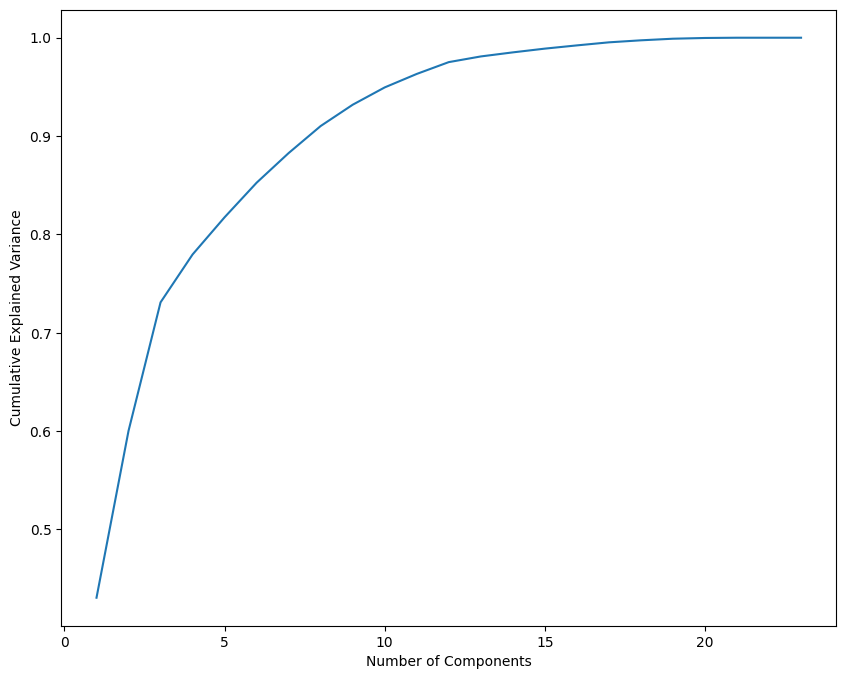

In [48]:
plt.figure(figsize=(10, 8))
plt.plot(range(1,24), pca.explained_variance_ratio_.cumsum())
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

In [49]:
pca = PCA(n_components=5)
scores_pca = pca.fit_transform(df_clustering)

In [50]:
def optimise_k_means(data, max_k):
    means = []
    inertias = []
    
    for k in range(1,max_k):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)
        
    fig = plt.subplots(figsize=(10, 5))
    plt.plot(means, inertias, 'o-')
    plt.xlabel("Number of Clusters")
    plt.ylabel("Inertia")
    plt.grid(True)
    plt.show()

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

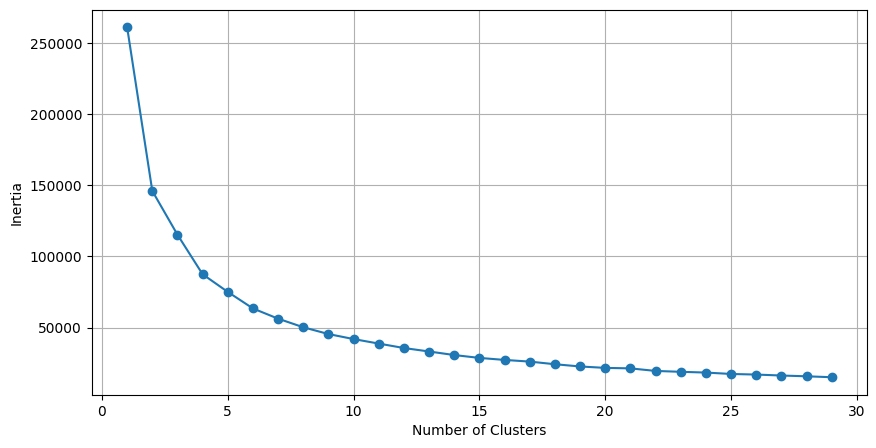

In [51]:
optimise_k_means(scores_pca, 30)

In [52]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(df_clustering)

C:\Users\didov\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=5)

In [55]:
df_Kmeans_PCA = pd.concat([df_clustering.reset_index(drop=True), pd.DataFrame(scores_pca)], axis = 1)
df_Kmeans_PCA.columns.values[-5:] = ['Component 1', 'Component 2', 'Component 3', 'Component 4', 'Component 5']
df_Kmeans_PCA['K-means Cluster'] = kmeans.labels_
df_Kmeans_PCA

,fire_size,fire_size_class,remoteness,stat_cause_descr_Arson,stat_cause_descr_Campfire,stat_cause_descr_Children,stat_cause_descr_Debris Burning,stat_cause_descr_Equipment Use,stat_cause_descr_Fireworks,stat_cause_descr_Lightning,...,Vegetation_12,Vegetation_14,Vegetation_15,Vegetation_16,Component 1,Component 2,Component 3,Component 4,Component 5,K-means Cluster
0,-0.141752,1.0,-1.510914,0,0,0,0,0,0,0,...,1,0,0,0,-0.133526,-1.541777,-0.243662,0.610253,-0.338737,0
1,-0.142225,0.0,-0.362027,1,0,0,0,0,0,0,...,0,0,1,0,-0.810076,-0.233501,0.141357,-0.533681,-0.699385,3
2,-0.138368,1.0,-0.291695,1,0,0,0,0,0,0,...,0,0,0,1,0.060013,-0.350667,-0.216294,-0.722863,-0.146482,3
3,-0.142361,0.0,1.730239,0,0,0,1,0,0,0,...,0,0,0,0,-0.492285,1.871630,0.230189,0.017795,0.826531,4
4,-0.142293,0.0,-0.153016,0,0,0,0,0,0,0,...,1,0,0,0,-0.822250,-0.022405,0.169026,0.647793,-0.496699,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55362,0.283169,5.0,0.653731,0,0,0,0,0,0,0,...,0,0,0,0,4.060761,0.057099,-1.345584,-0.059167,0.158580,1
55363,4.653445,5.0,-0.773945,0,0,0,0,0,0,0,...,0,0,0,0,5.475278,-1.691255,2.659745,-0.135980,0.042583,1
55364,0.243445,5.0,-0.960333,1,0,0,0,0,0,0,...,0,0,0,0,3.767589,-1.533586,-1.408006,-0.266725,-0.216092,1
55365,0.078254,4.0,-0.404472,0,0,0,0,0,0,0,...,0,0,1,0,2.889630,-0.849590,-1.186633,-0.251907,-0.369946,1


In [59]:
x = df_Kmeans_PCA['Component 1']
y = df_Kmeans_PCA['Component 2']
plt.figure(figsize=(10, 8))
px.scatter(df_Kmeans_PCA, x=x,y=y,color=df_Kmeans_PCA['K-means Cluster'])



<Figure size 1000x800 with 0 Axes>